<a href="https://colab.research.google.com/github/kr-pushpam/DeepGenerativeModel_Aug24/blob/main/Consolidated_Q1_Q3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


    1.  Train a DC GAN (with an architecture of your choice) on the given data with the usual GAN loss. Plot the loss curves for the Generator and  Discriminator losses.
    2.  Plot a 10 by 10 grid of images for generated images.
    3.  Vary the number of times the generator and discriminator is trained and
    document the outcome.


# Imports

In [1]:
# Import required libraries
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from PIL import Image
from torch.utils.data import Dataset, DataLoader, random_split
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch.autograd as autograd
from torch.utils.data import random_split
import torch.nn.functional as F
from scipy.linalg import sqrtm
from torchvision import models
import random

import shutil # file management utilities
import gdown  # gdown is used to download files from Google Drive
import zipfile  # zipfile is used to handle zip files (like extracting them)

# Solution 1 - Code
  Dataset Used : Butterfly
  

# Solution 1 - Summary

  *  Architecture:
  *  Dataset:
  *  Observations:


# Solution 2 - Summary

  *  Architecture:
  *  Dataset:
  *  Observations:


# Solution 3
**Q. Vary the number of times the generator and discriminator is trained and document the outcome.**

*  Dataset Used : Animal Dataset
*  Approach : Experiment with three different scenarios:
  *  Scenario 1:  Equal training of the generator and discriminator (critic).
  *  Scenario 2:  Training the generator 5 times for every 1 discriminator update.
  *  Scenario 3:  Training the discriminator 5 times for every 1 generator update.
*  Generator & Discrimator Blocks for Animal Data
*  Params used for Training:
*  Outcome/Observations

# Solution 3.1 - Preparing the data
*  Dataset used - Animal Dataset, stored on google drive
*  Downloaded and Extractd into local drive for further training
*  Customize the data & buid dataloader for model training
*  Advantage - dont need to load data into collab local env everytime

In [2]:
# Mount google drive and import data into local folder
from google.colab import drive
drive.mount('/content/drive')

file_id = '1lBkM874rRc8aTQAI3gn67urH9jh1GgmJ'             # The file_id corresponds to the file you want to download from Google Drive
download_url = f"https://drive.google.com/uc?id={file_id}" # Construct the direct download URL using the file_id, link that allows direct download

output = '/content/animal_dataset.zip'# Define the destination path for the downloaded zip file in Colab's local filesystem
gdown.download(download_url, output, quiet=False) # Download the zip file from Google Drive to Colab's local storage i.e. output path
extracted_path = '/content/'# Define the extraction path in Colab's local storage where the dataset will be extracted, root in this case

# Unzip the downloaded dataset from the zip file
# Unzipping the zip file located at 'output' and extracting it to 'extracted_path' , root in this case
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(extracted_path)  # Extract all files to /content/

# This lists all the files and directories in the /content/ directory (where the dataset was extracted)
print("Extracted File", os.listdir(extracted_path))


Mounted at /content/drive


Downloading...
From (original): https://drive.google.com/uc?id=1lBkM874rRc8aTQAI3gn67urH9jh1GgmJ
From (redirected): https://drive.google.com/uc?id=1lBkM874rRc8aTQAI3gn67urH9jh1GgmJ&confirm=t&uuid=6754fec5-2d37-4d12-85e6-d9a4a8661f9c
To: /content/animal_dataset.zip
100%|██████████| 701M/701M [00:05<00:00, 128MB/s] 


Extracted File ['.config', 'animal_dataset.zip', 'drive', 'Animals_data', 'sample_data']


In [3]:
# file management utilities
dir_path = "/content/content/Animals_data_backup"

# shutil.rmtree(dir_path) # remove or delete a given directory
# shutil.copytree("Animals_data", "Animals_data_backup") # copy a given directory

'Animals_data_backup'

In [4]:
#Step1. Explore The Dataset
#About Dataset- Counting Classes and Images in a Dataset
root_directory = "/content/Animals_data/animals/animals"

num_classes, num_images = 0,0

for class_folder in os.listdir(root_directory):
    class_path = os.path.join(root_directory, class_folder)

    if os.path.isdir(class_path):
        num_classes += 1
        images_in_class = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
        num_images += len(images_in_class)

print(f"Number of classes (folders): {num_classes}")
print(f"Number of images: {num_images}")

Number of classes (folders): 90
Number of images: 5400


In [5]:
# Create customized Dataset and Dataloader for model training

# Define the path to your text file and dataset root directory
txt_file = '/content/Animals_data/name of the animals.txt'  # Replace with the actual path to your text file
dataset_root_dir = "/content/Animals_data/animals/animals"  # Replace with the actual path to your dataset directory

# Read class names from the text file
with open(txt_file, 'r') as f:
    classes = [line.strip() for line in f.readlines()]  # Clean class names

# Create a dictionary to map class names to indices
class_to_idx = {cls_name: idx for idx, cls_name in enumerate(classes)}

# Define a custom dataset class
class AnimalDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert("RGB")
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

# Store the paths of all images and their corresponding labels
image_paths = []
labels = []

# Iterate over each class folder and store the images and labels
for class_name in os.listdir(dataset_root_dir):
    class_dir = os.path.join(dataset_root_dir, class_name)
    if os.path.isdir(class_dir):
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            if os.path.isfile(img_path):
                image_paths.append(img_path)
                labels.append(class_to_idx[class_name])  # Map folder name to label

# Define transformations
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize all images to 128x128 pixels
    transforms.ToTensor(),  # Convert images to tensor format
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize between -1 and 1
])

# Create the dataset
dataset = AnimalDataset(image_paths, labels, transform=transform)

# Check the dataset size
print(f"Number of samples in the dataset: {len(dataset)}")


# Define DataLoader
data_loader = DataLoader(
    dataset,  # The training dataset split
    batch_size=32,  # Number of images in each batch
    shuffle=True,  # Shuffle the dataset after each epoch for better training
    num_workers=4  # Number of subprocesses to use for data loading (speed up)
)

# Print confirmation
print("DataLoader for training and testing sets created successfully.")


Number of samples in the dataset: 5400
DataLoader for training and testing sets created successfully.


# Solution 3.2 - Architecture of Gen and Dis Blocks (for Animal Data)


In [6]:
import torch
import torch.nn as nn

# Generator Block
class GenBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        super(GenBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(False)
        )

    def forward(self, x):
        return self.block(x)

# Generator
class Generator(nn.Module):
    def __init__(self, latent_dim=100, image_channels=3, feature_maps_g=64):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # Input: (latent_dim, 1, 1)
            GenBlock(latent_dim, feature_maps_g * 8, 4, 1, 0),  # Output: (feature_maps_g * 8, 4, 4)
            GenBlock(feature_maps_g * 8, feature_maps_g * 4),    # Output: (feature_maps_g * 4, 8, 8)
            GenBlock(feature_maps_g * 4, feature_maps_g * 2),    # Output: (feature_maps_g * 2, 16, 16)
            GenBlock(feature_maps_g * 2, feature_maps_g),        # Output: (feature_maps_g, 32, 32)
            nn.ConvTranspose2d(feature_maps_g, image_channels, 4, 2, 1),  # Output: (image_channels, 64, 64)
            nn.ConvTranspose2d(image_channels, image_channels, 4, 2, 1),  # Output: (image_channels, 128, 128)
            nn.Tanh()  # Output pixel values in the range [-1, 1]
        )

    def forward(self, x):
        return self.net(x)

# Discriminator Block
class DisBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        super(DisBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, False),
            nn.Dropout(0.3)
        )

    def forward(self, x):
        return self.block(x)

# Discriminator
class Discriminator(nn.Module):
    def __init__(self, image_channels=3, feature_maps_d=64):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # Input: (image_channels, 128, 128)
            nn.Conv2d(image_channels, feature_maps_d, 4, 2, 1),  # Output: (feature_maps_d, 64, 64)
            nn.LeakyReLU(0.2, False),
            DisBlock(feature_maps_d, feature_maps_d * 2),        # Output: (feature_maps_d * 2, 32, 32)
            DisBlock(feature_maps_d * 2, feature_maps_d * 4),    # Output: (feature_maps_d * 4, 16, 16)
            DisBlock(feature_maps_d * 4, feature_maps_d * 8),    # Output: (feature_maps_d * 8, 8, 8)
            DisBlock(feature_maps_d * 8, feature_maps_d * 16),   # Output: (feature_maps_d * 16, 4, 4)
            nn.Conv2d(feature_maps_d * 16, 1, 4, 1, 0),         # Output: (1, 1, 1)
            nn.Sigmoid()  # Scalar output probability
        )

    def forward(self, x):
        return self.net(x).view(-1)


In [7]:
# Create the instance of 'Generator' and 'Discriminator' classes
generator = Generator()
discriminator = Discriminator()

# Define the loss function: Binary Cross-Entropy Loss (BCE Loss)
criterion = nn.BCELoss()

# Defining the optimizers (using Adam for standard GAN)
optimizer_gen = optim.Adam(generator.parameters(), lr=0.0003, betas=(0.5, 0.999))  # Adam optimizer for Generator
optimizer_dis = optim.Adam(discriminator.parameters(), lr=0.0001, betas=(0.5, 0.999))  # Adam optimizer for Discriminator

# Set the device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move models to the device (GPU/CPU)
generator.to(device)
discriminator.to(device)

# Hyperparameters
epochs = 5  # Number of training epochs
batch_size = 32
latent_dim = 100  # Size of the noise vector (input to generator)

# Create fixed noise for generating images later
fixed_noise = torch.randn(16, latent_dim, 1, 1, device=device)

# Lists to store losses for plotting
gen_losses = []
dis_losses = []

# Print the model architectures to verify the setup
print(generator)
print(discriminator)

Generator(
  (net): Sequential(
    (0): GenBlock(
      (block): Sequential(
        (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
    )
    (1): GenBlock(
      (block): Sequential(
        (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
    )
    (2): GenBlock(
      (block): Sequential(
        (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
    )
    (3): GenBlock(
      (block): Sequential(
        (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (

# Solution 3.3 - GAN Training - for 3 Scenarios

Epoch [0/5] | Step [0/169] | D Loss: 1.4345 | G Loss: 0.6478
Epoch [0/5] | Step [100/169] | D Loss: 1.4776 | G Loss: 0.6077


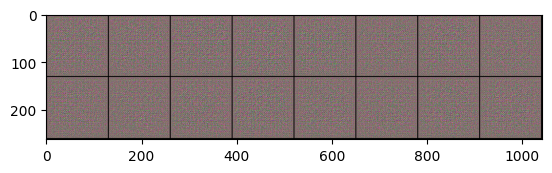

Epoch [1/5] | Step [0/169] | D Loss: 1.4322 | G Loss: 0.6804
Epoch [1/5] | Step [100/169] | D Loss: 1.3785 | G Loss: 0.6190


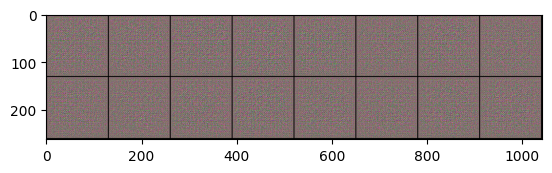

Epoch [2/5] | Step [0/169] | D Loss: 1.4681 | G Loss: 0.6873
Epoch [2/5] | Step [100/169] | D Loss: 1.4602 | G Loss: 0.6756


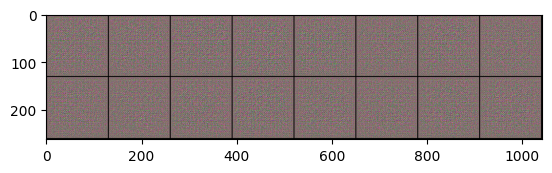

Epoch [3/5] | Step [0/169] | D Loss: 1.4418 | G Loss: 0.6621
Epoch [3/5] | Step [100/169] | D Loss: 1.4368 | G Loss: 0.6196


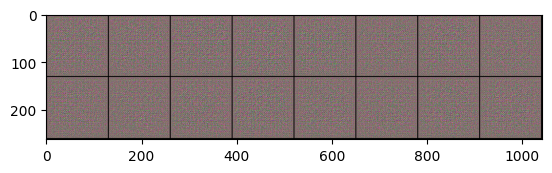

Epoch [4/5] | Step [0/169] | D Loss: 1.4648 | G Loss: 0.6721
Epoch [4/5] | Step [100/169] | D Loss: 1.3876 | G Loss: 0.6400


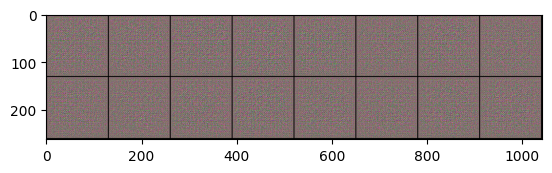

Models for Scenario 1 saved after all epochs.


In [8]:
#Scenario 1 : Gen 1 , Dis 1

# Lists to store losses for plotting
# Create the instance of 'Generator' and 'Discriminator' classes
generator_1 = Generator()
discriminator_1 = Discriminator()
gen_losses_1 = []
dis_losses_1 = []

# Move models to the device (GPU/CPU)
generator_1.to(device) # Move generator to the device
discriminator_1.to(device) # Move discriminator to the device

#Scenario 1 : Gen 1 , Dis 1
#workigm dont touch
# Training Loop
for epoch in range(epochs):
    for i, (real_images, _) in enumerate(data_loader):
        real_images = real_images.to(device)
        batch_size = real_images.size(0)

        #### Train Discriminator ####
        optimizer_dis.zero_grad()

        # Create labels for real and fake images
        real_labels = torch.full((batch_size, 1), 0.9, device=device)  # Real images labeled as 1
        fake_labels = torch.zeros(batch_size, 1, device=device)  # Fake images labeled as 0

        # Forward pass real images through discriminator
        output_real = discriminator_1(real_images).view(-1, 1)
        loss_real = criterion(output_real, real_labels)  # Loss for real images

        # Generate fake images
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
        fake_images = generator_1(noise)  # Correct input to generator: (batch_size, latent_dim, 1, 1)

        # Forward pass fake images through discriminator
        output_fake = discriminator_1(fake_images.detach()).view(-1, 1)
        loss_fake = criterion(output_fake, fake_labels)  # Loss for fake images

        # Total discriminator loss
        loss_dis = loss_real + loss_fake
        loss_dis.backward()
        optimizer_dis.step()

        #### Train Generator ####
        optimizer_gen.zero_grad()

        # Generate fake images and forward pass through discriminator again
        output_fake = discriminator_1(fake_images).view(-1, 1)
        loss_gen = criterion(output_fake, real_labels)  # Generator tries to fool discriminator

        loss_gen.backward()
        optimizer_gen.step()

        # Store losses for later plotting
        gen_losses_1.append(loss_gen.item())
        dis_losses_1.append(loss_dis.item())

        # Print progress every 100 batches
        if i % 100 == 0:
            print(f'Epoch [{epoch}/{epochs}] | Step [{i}/{len(data_loader)}] | '
                  f'D Loss: {loss_dis.item():.4f} | G Loss: {loss_gen.item():.4f}')

    # Generate and display images at the end of each epoch
    with torch.no_grad():
        fake_images = generator_1(fixed_noise).detach().cpu()
        grid = torchvision.utils.make_grid(fake_images, padding=2, normalize=True)
        plt.imshow(np.transpose(grid, (1, 2, 0)))
        plt.show()

# Save the models after all epochs are completed
torch.save(generator_1.state_dict(), 'generator_1_final.pth')
torch.save(discriminator_1.state_dict(), 'discriminator_1_final.pth')
print("Models for Scenario 1 saved after all epochs.")


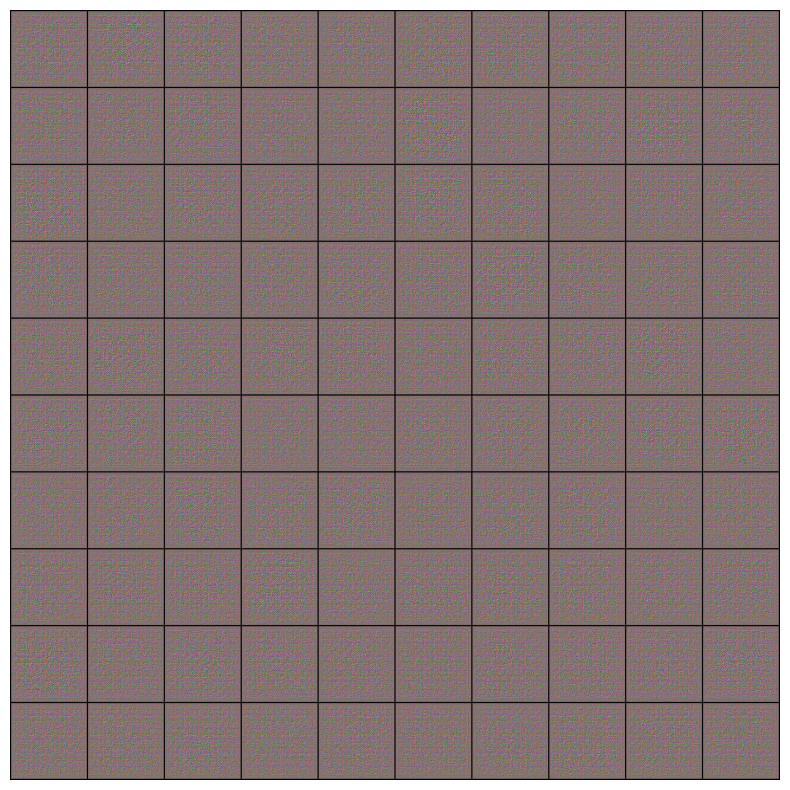

In [9]:
with torch.no_grad():
    # Generate 100 images for a 10x10 grid
    noise = torch.randn(100, latent_dim, 1, 1, device=device)
    generated_images = generator_1(noise)

    # Create a 10x10 grid of images
    grid = torchvision.utils.make_grid(generated_images, nrow=10, padding=2, normalize=True)

    # Plot the 10x10 grid of images
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))  # Transpose the image dimensions for matplotlib
    plt.axis("off")  # Turn off the axis
    plt.show()

Epoch [0/5] | Step [0/169] | D Loss: 1.4068 | G Loss: 0.7110
Epoch [0/5] | Step [100/169] | D Loss: 1.4609 | G Loss: 0.6920


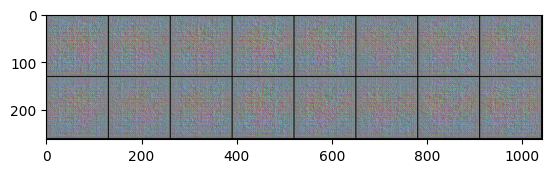

Epoch [1/5] | Step [0/169] | D Loss: 1.5030 | G Loss: 0.6762
Epoch [1/5] | Step [100/169] | D Loss: 1.3811 | G Loss: 0.6946


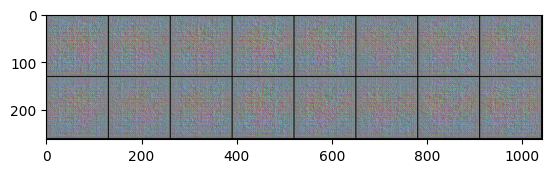

Epoch [2/5] | Step [0/169] | D Loss: 1.5612 | G Loss: 0.7056
Epoch [2/5] | Step [100/169] | D Loss: 1.4653 | G Loss: 0.7225


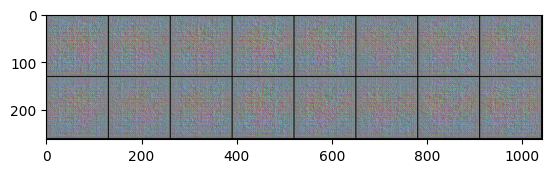

Epoch [3/5] | Step [0/169] | D Loss: 1.4591 | G Loss: 0.6767
Epoch [3/5] | Step [100/169] | D Loss: 1.3273 | G Loss: 0.6904


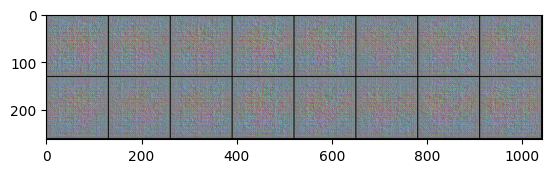

Epoch [4/5] | Step [0/169] | D Loss: 1.4086 | G Loss: 0.7428
Epoch [4/5] | Step [100/169] | D Loss: 1.3420 | G Loss: 0.7138


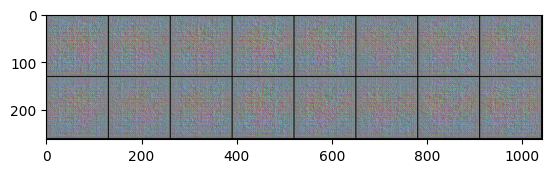

Models saved after all epochs.


In [10]:
# Scenario 2: Train the generator 5 times for every 1 discriminator update

# Create the instance of 'Generator' and 'Discriminator' classes
generator_2 = Generator()
discriminator_2 = Discriminator()
gen_losses_2 = []
dis_losses_2 = []

# Move models to the device (GPU/CPU)
generator_2.to(device) # Move generator to the device
discriminator_2.to(device) # Move discriminator to the device

# Training Loop
for epoch in range(epochs):
    for i, (real_images, _) in enumerate(data_loader):
        real_images = real_images.to(device)  # Move real images to the correct device
        batch_size = real_images.size(0)

        #### Train Discriminator ####
        optimizer_dis.zero_grad()

        # Create labels for real and fake images
        real_labels = torch.full((batch_size, 1), 0.9, device=device)  # Real images labeled as 1
        fake_labels = torch.zeros(batch_size, 1, device=device)  # Fake images labeled as 0

        # Forward pass real images through discriminator
        output_real = discriminator_2(real_images)
        output_real = torch.flatten(output_real)  # Flatten the output
        loss_real = criterion(output_real, real_labels.view(-1))  # Loss for real images

        # Generate fake images
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)  # Generate noise on correct device
        fake_images = generator_2(noise).to(device)  # Move fake images to the correct device

        # Forward pass fake images through discriminator
        output_fake = discriminator_2(fake_images.detach())
        output_fake = torch.flatten(output_fake)  # Flatten the output
        loss_fake = criterion(output_fake, fake_labels.view(-1))  # Loss for fake images

        # Total discriminator loss
        loss_dis = loss_real + loss_fake
        loss_dis.backward()
        optimizer_dis.step()

        #### Train Generator 5 times ####
        for _ in range(5):
            optimizer_gen.zero_grad()

            # Generate fake images and forward pass through discriminator again
            fake_images = generator_2(noise).to(device)  # Generate new fake images on the correct device
            output_fake = discriminator_2(fake_images)
            output_fake = torch.flatten(output_fake)  # Flatten the output
            loss_gen = criterion(output_fake, real_labels.view(-1))  # Generator tries to fool discriminator

            loss_gen.backward()
            optimizer_gen.step()

        # Store losses for later plotting
        gen_losses_2.append(loss_gen.item())
        dis_losses_2.append(loss_dis.item())

        # Print progress every 100 batches
        if i % 100 == 0:
            print(f'Epoch [{epoch}/{epochs}] | Step [{i}/{len(data_loader)}] | '
                  f'D Loss: {loss_dis.item():.4f} | G Loss: {loss_gen.item():.4f}')

    # Generate and display images at the end of each epoch
    with torch.no_grad():
        fake_images = generator(fixed_noise).to(device).detach().cpu()
        grid = torchvision.utils.make_grid(fake_images, padding=2, normalize=True)
        plt.imshow(np.transpose(grid, (1, 2, 0)))
        plt.show()

# # Save the models after all epochs are completed
torch.save(generator_2.state_dict(), 'generator_2_final.pth')
torch.save(discriminator_2.state_dict(), 'discriminator_2_final.pth')
print("Models saved after all epochs.")


Epoch [0/5] | Step [0/169] | D Loss: 1.4316 | G Loss: 0.7708
Epoch [0/5] | Step [100/169] | D Loss: 1.4165 | G Loss: 0.7328


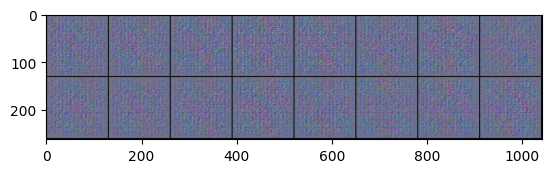

Epoch [1/5] | Step [0/169] | D Loss: 1.3896 | G Loss: 0.7292
Epoch [1/5] | Step [100/169] | D Loss: 1.4673 | G Loss: 0.7617


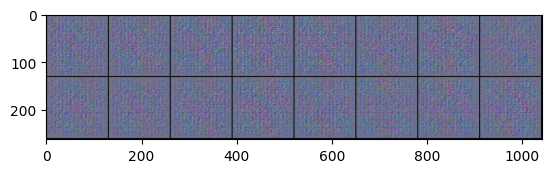

Epoch [2/5] | Step [0/169] | D Loss: 1.4447 | G Loss: 0.8289
Epoch [2/5] | Step [100/169] | D Loss: 1.3667 | G Loss: 0.7783


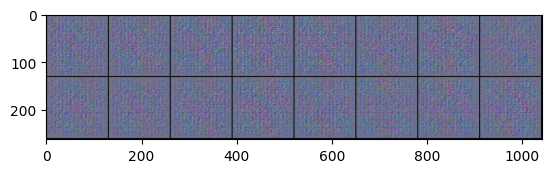

Epoch [3/5] | Step [0/169] | D Loss: 1.3985 | G Loss: 0.8101
Epoch [3/5] | Step [100/169] | D Loss: 1.3882 | G Loss: 0.8375


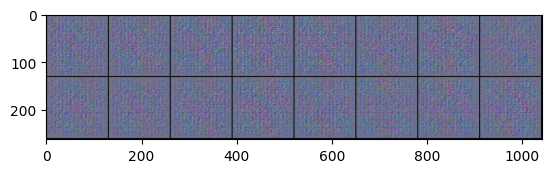

Epoch [4/5] | Step [0/169] | D Loss: 1.4405 | G Loss: 0.8003
Epoch [4/5] | Step [100/169] | D Loss: 1.4867 | G Loss: 0.7485


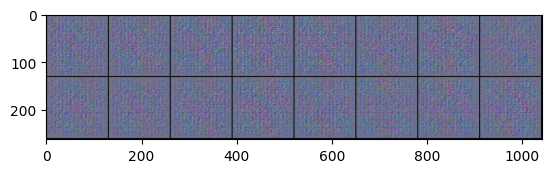

Models saved after all epochs.


In [11]:
# Scenario 3: Train the discriminator 5 times for every 1 generator update
# Create the instance of 'Generator' and 'Discriminator' classes
generator_3 = Generator()
discriminator_3 = Discriminator()
gen_losses_3 = []
dis_losses_3 = []

# Move models to the device (GPU/CPU)
generator_3.to(device) # Move generator to the device
discriminator_3.to(device) # Move discriminator to the device
# Training Loop
for epoch in range(epochs):
    for i, (real_images, _) in enumerate(data_loader):
        real_images = real_images.to(device)  # Move real images to the correct device
        batch_size = real_images.size(0)

        #### Train Discriminator 5 times ####
        for _ in range(5):
            optimizer_dis.zero_grad()

            # Create labels for real and fake images
            real_labels = torch.full((batch_size, 1), 0.9, device=device)  # Real images labeled as 1
            fake_labels = torch.zeros(batch_size, 1, device=device)  # Fake images labeled as 0

            # Forward pass real images through discriminator
            output_real = discriminator_3(real_images)
            output_real = torch.flatten(output_real)  # Flatten the output
            loss_real = criterion(output_real, real_labels.view(-1))  # Loss for real images

            # Generate fake images
            noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)  # Generate noise on correct device
            fake_images = generator_3(noise).to(device)  # Move fake images to the correct device

            # Forward pass fake images through discriminator
            output_fake = discriminator_3(fake_images.detach())
            output_fake = torch.flatten(output_fake)  # Flatten the output
            loss_fake = criterion(output_fake, fake_labels.view(-1))  # Loss for fake images

            # Total discriminator loss
            loss_dis = loss_real + loss_fake
            loss_dis.backward()
            optimizer_dis.step()

        #### Train Generator ####
        optimizer_gen.zero_grad()

        # Generate fake images and forward pass through discriminator again
        fake_images = generator_3(noise).to(device)  # Generate new fake images on the correct device
        output_fake = discriminator_3(fake_images)
        output_fake = torch.flatten(output_fake)  # Flatten the output
        loss_gen = criterion(output_fake, real_labels.view(-1))  # Generator tries to fool discriminator

        loss_gen.backward()
        optimizer_gen.step()

        # Store losses for later plotting
        gen_losses_3.append(loss_gen.item())
        dis_losses_3.append(loss_dis.item())

        # Print progress every 100 batches
        if i % 100 == 0:
            print(f'Epoch [{epoch}/{epochs}] | Step [{i}/{len(data_loader)}] | '
                  f'D Loss: {loss_dis.item():.4f} | G Loss: {loss_gen.item():.4f}')

    # Generate and display images at the end of each epoch
    with torch.no_grad():
        fake_images = generator_3(fixed_noise).to(device).detach().cpu()
        grid = torchvision.utils.make_grid(fake_images, padding=2, normalize=True)
        plt.imshow(np.transpose(grid, (1, 2, 0)))
        plt.show()

# Save the models after all epochs are completed
torch.save(generator_3.state_dict(), 'generator_3_final.pth')
torch.save(discriminator_3.state_dict(), 'discriminator_3_final.pth')
print("Models saved after all epochs.")


# Solution 3.4 - Interpretation Of result

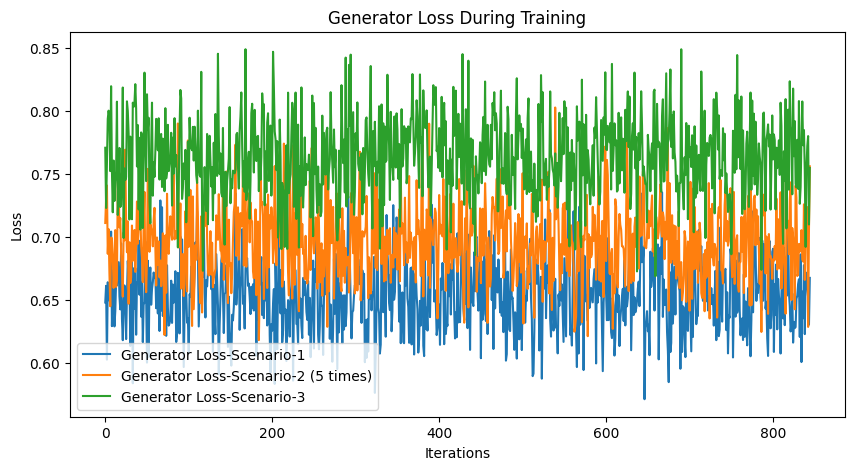

In [12]:
plt.figure(figsize=(10, 5))
plt.plot(gen_losses_1, label="Generator Loss-Scenario-1")
plt.plot(gen_losses_2, label="Generator Loss-Scenario-2 (5 times)")
plt.plot(gen_losses_3, label="Generator Loss-Scenario-3")

plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Generator Loss During Training")
plt.legend()
plt.show()

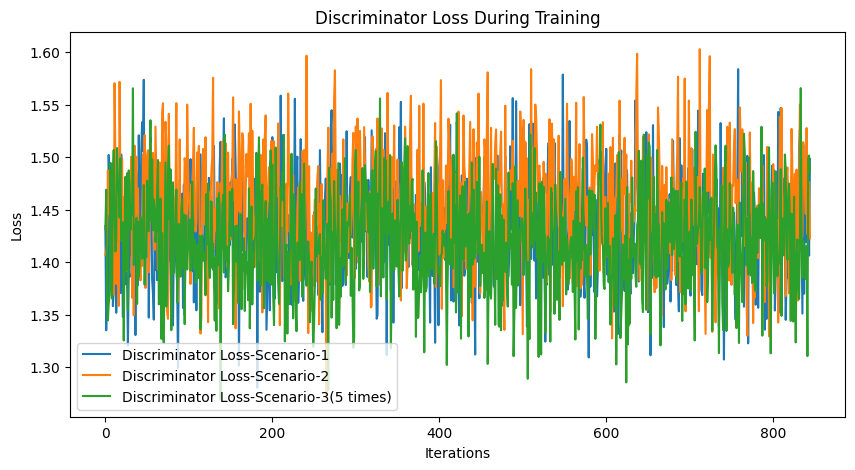

In [13]:
plt.figure(figsize=(10, 5))

plt.plot(dis_losses_1, label="Discriminator Loss-Scenario-1")
plt.plot(dis_losses_2, label="Discriminator Loss-Scenario-2")
plt.plot(dis_losses_3, label="Discriminator Loss-Scenario-3(5 times)")

plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Discriminator Loss During Training")
plt.legend()
plt.show()

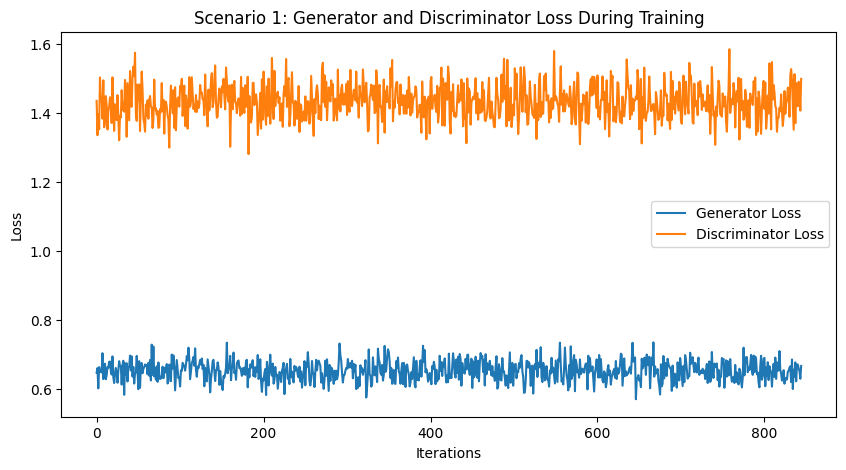

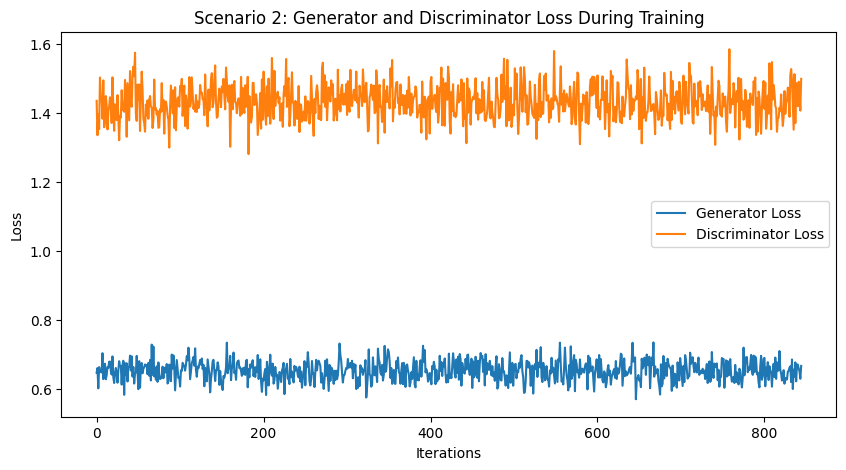

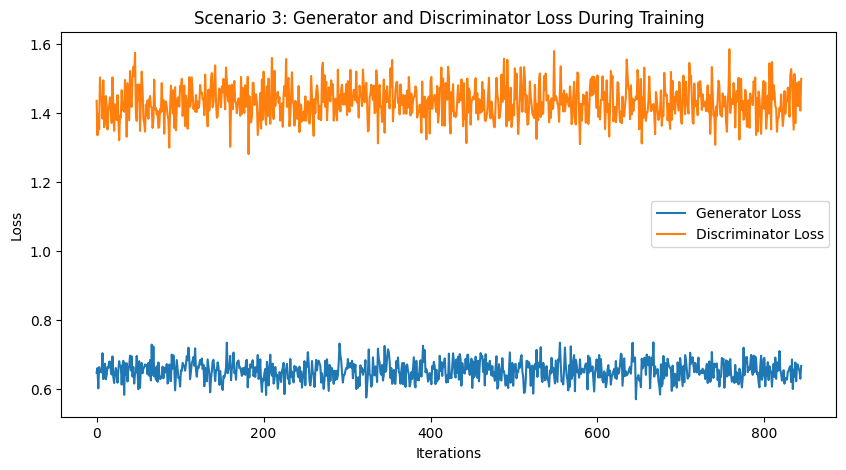

In [14]:
plt.figure(figsize=(10, 5))
plt.plot(gen_losses_1, label="Generator Loss")
plt.plot(dis_losses_1, label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Scenario 1: Generator and Discriminator Loss During Training")
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(gen_losses_1, label="Generator Loss")
plt.plot(dis_losses_1, label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Scenario 2: Generator and Discriminator Loss During Training")
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(gen_losses_1, label="Generator Loss")
plt.plot(dis_losses_1, label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Scenario 3: Generator and Discriminator Loss During Training")
plt.legend()
plt.show()


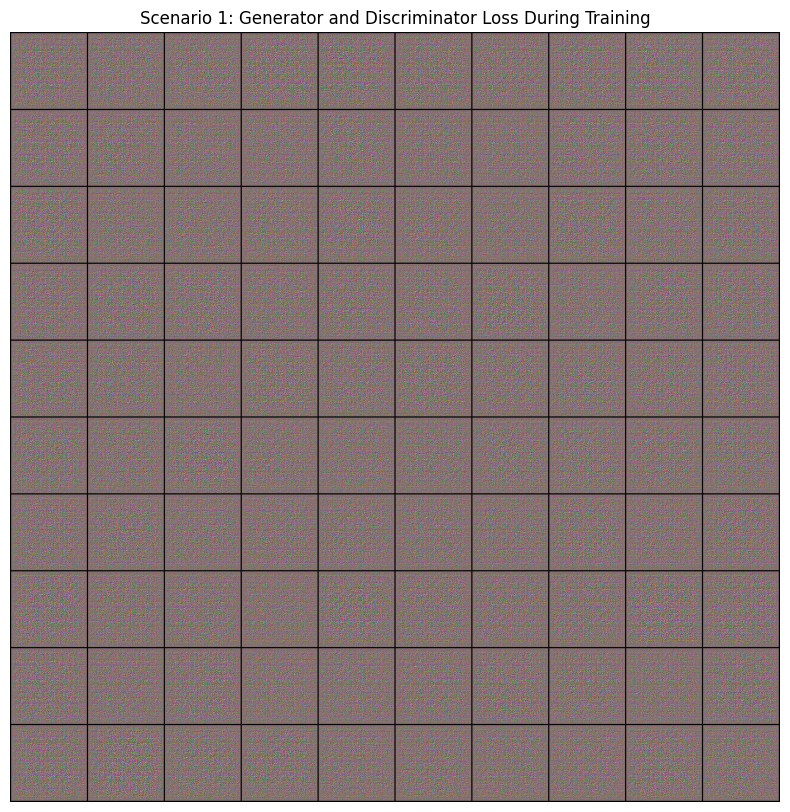

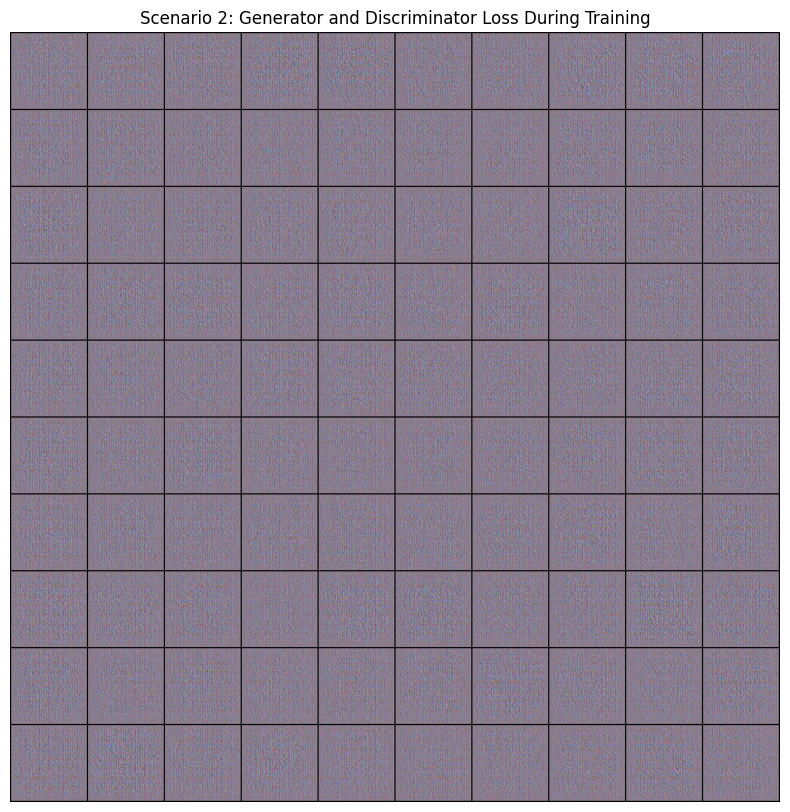

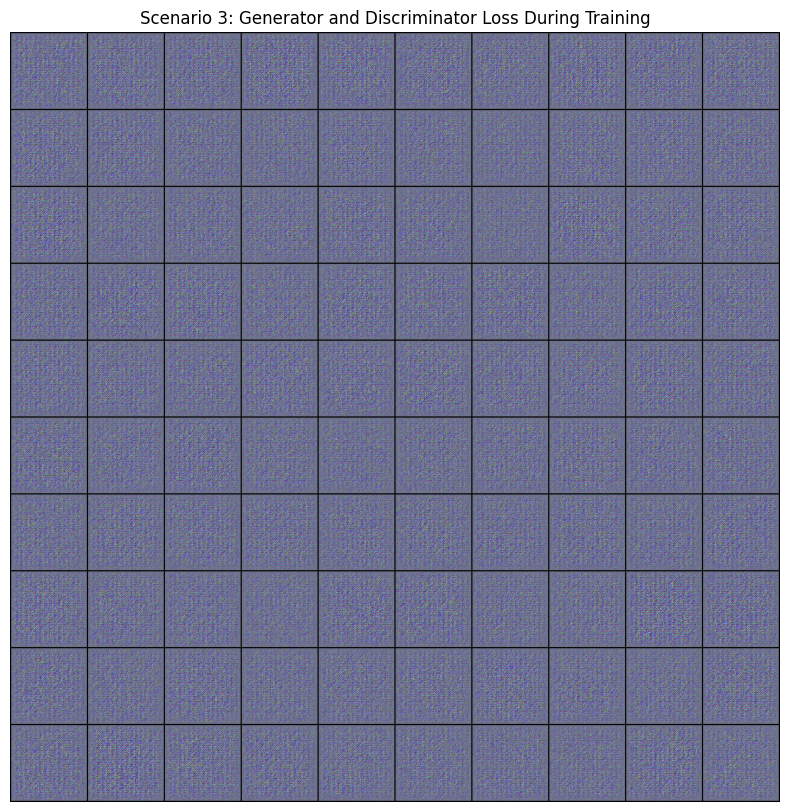

In [15]:
#Plot a 10 by 10 grid of images for generated images for each scenarios
with torch.no_grad():
    # Generate 100 images for a 10x10 grid
    noise = torch.randn(100, latent_dim, 1, 1, device=device)
    generated_images_1 = generator_1(noise)
    generated_images_2 = generator_2(noise)
    generated_images_3 = generator_3(noise)

    # Create a 10x10 grid of images of imgaes from scenario 1
    grid_1 = torchvision.utils.make_grid(generated_images_1, nrow=10, padding=2, normalize=True)
    # Create a 10x10 grid of images of imgaes from scenario 2
    grid_2 = torchvision.utils.make_grid(generated_images_2, nrow=10, padding=2, normalize=True)
    # Create a 10x10 grid of images of imgaes from scenario 3
    grid_3 = torchvision.utils.make_grid(generated_images_3, nrow=10, padding=2, normalize=True)


    # Plot the 10x10 grid of images
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(grid_1.cpu(), (1, 2, 0)))  # Transpose the image dimensions for matplotlib
    plt.axis("off")  # Turn off the axis
    plt.title("Scenario 1: Generator and Discriminator Loss During Training")
    plt.show()

     # Plot the 10x10 grid of images
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(grid_2.cpu(), (1, 2, 0)))  # Transpose the image dimensions for matplotlib
    plt.axis("off")  # Turn off the axis
    plt.title("Scenario 2: Generator and Discriminator Loss During Training")
    plt.show()

    # Plot the 10x10 grid of images
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(grid_3.cpu(), (1, 2, 0)))  # Transpose the image dimensions for matplotlib
    plt.axis("off")  # Turn off the axis
    plt.title("Scenario 3: Generator and Discriminator Loss During Training")
    plt.show()